In [8]:
!pip install neuralprophet

NeuralProphet

In [ ]:
#!pip install neuralprophet
# neuralprophet does not work with colab unless numpy1.23.5: https://github.com/googlecolab/colabtools/issues/3752
!pip uninstall numpy
!pip install git+https://github.com/ourownstory/neural_prophet.git numpy==1.25.0

  Cloning https://github.com/ourownstory/neural_prophet.git to /tmp/pip-req-build-s_swq_tp
  Running command git clone --filter=blob:none --quiet https://github.com/ourownstory/neural_prophet.git /tmp/pip-req-build-s_swq_tp
  Resolved https://github.com/ourownstory/neural_prophet.git to commit 23543560b4ed278e84d1fd0f119d332342336d0d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 55.1 MB/s eta 0:00:00
  Using cached kaleido-0.2.1-py2.py3-none-manylinux1_x86_64.whl (79.9 MB)
  Created wheel for neuralprophet: filename=neuralprophet-1.0.0rc10-py3-none-any.whl size=145405 sha256=b79cf859e17277753c22f91c21238f592f5d24aa581d47e4f38d7f733ac5cf77
  Stored in directory: /tmp/pip-ephem-wheel-cache-ycpetyme/wheels/32/ce/37/d289cb9c67e62f7912fc3a25e624277ea47902c32e24371a78
Successfully built neuralprophet
  Attempting uninstall: neuralprophet
    Foun

In [9]:
from neuralprophet import set_random_seed
set_random_seed(0)

In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import logging
import warnings
logging.getLogger('prophet').setLevel(logging.ERROR)
warnings.filterwarnings("ignore")

In [ ]:
# If you use Google Colab, use the following:
from google.colab import drive
drive.mount('/content/gdrive')

path = '/content/gdrive/My Drive/data/time_series'
data = pd.read_csv(path + '/bike_sharing_daily.csv')
# convert string to datetime64
data["ds"] = pd.to_datetime(data["dteday"])
data.tail()

Mounted at /content/gdrive


In [2]:
# If you use your local computer, use this. You will need to download the data to your local folder.
path = '/Users/Documents/Documents/My_documents_all/Book_neural_network_time_series_anomaly_detection/data'
data = pd.read_csv(path + '/bike_sharing_daily.csv')
# convert string to datetime64
data["ds"] = pd.to_datetime(data["dteday"])
data.tail()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,ds
726,727,12/27/12,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114,2012-12-27
727,728,12/28/12,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095,2012-12-28
728,729,12/29/12,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341,2012-12-29
729,730,12/30/12,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796,2012-12-30
730,731,12/31/12,1,1,12,0,1,1,2,0.215833,0.223487,0.577500,0.154846,439,2290,2729,2012-12-31


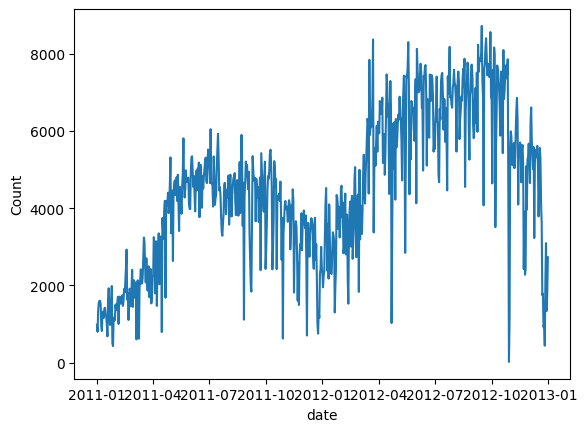

In [3]:
# create line plot of sales data
plt.plot(data['ds'], data["cnt"])
plt.xlabel("date")
plt.ylabel("Count")
plt.show()

In [5]:
df = data[['ds','cnt']]
df.columns = ['ds','y']

In [13]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# Model and prediction
m = NeuralProphet(
    n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
)
m.set_plotting_backend("matplotlib")
metrics = m.fit(df)
forecast = m.predict(df)

WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 130
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (23) is too small than the required number                     for the learning rate finder (222). The results might not be optimal.
Finding best initial 

Epoch 130: 100%|██████████| 130/130 [00:00<00:00, 3711.22it/s, loss=0.0212, v_num=47, MAE=675.0, RMSE=929.0, Loss=0.0204, RegLoss=0.000]   


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 468.17it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


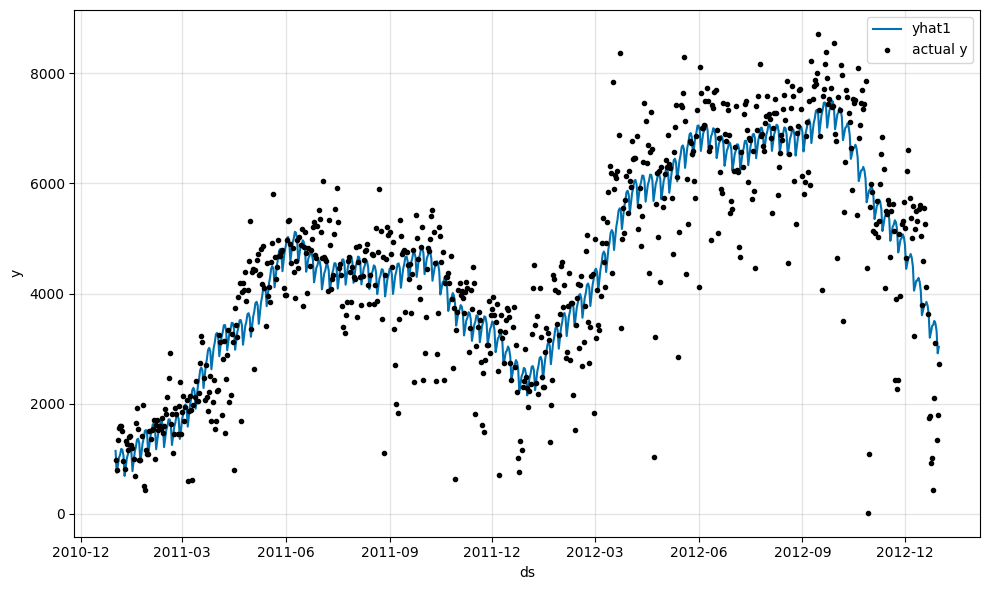

In [14]:
m.plot(forecast)

## Auto-regression

## AR-only
Now we add autoregression to our model with the n_lags parameter.

In [15]:
# Model and prediction
m = NeuralProphet(
    # Disable trend changepoints
    n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m.set_plotting_backend("matplotlib")  # Use matplotlib

metrics = m.fit(df)
forecast = m.predict(df)

WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 130
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (23) is too small than the required number                     for the learning rate finder (222). The results might not be optimal.
Finding best initial 

Epoch 130: 100%|██████████| 130/130 [00:00<00:00, 4604.07it/s, loss=0.0191, v_num=48, MAE=653.0, RMSE=914.0, Loss=0.020, RegLoss=0.000]    

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.


INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 637.34it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


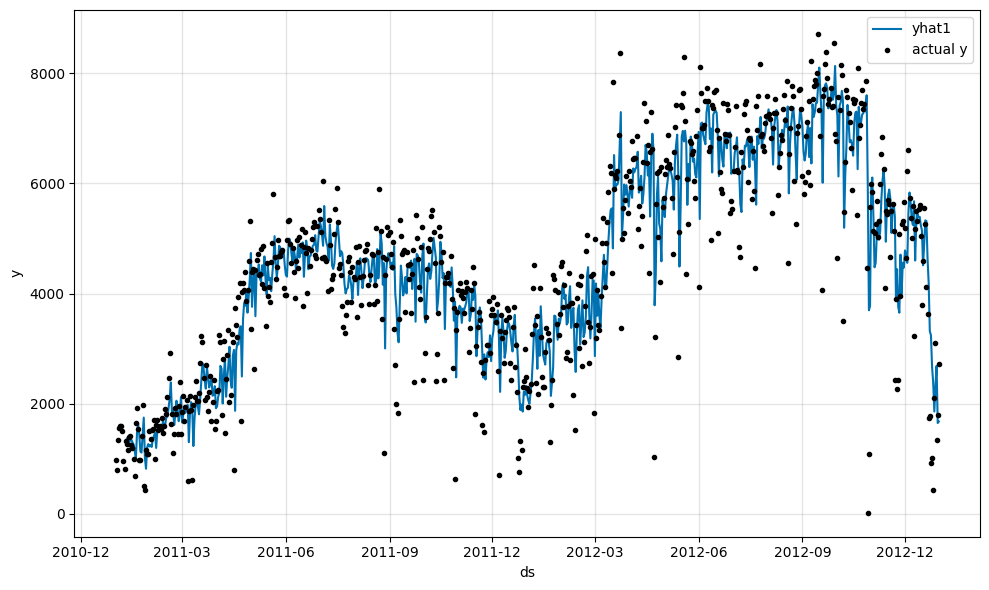

In [16]:
m.plot(forecast)

We have limited the change point to zero. Let's check if the trend is a straight line.

WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


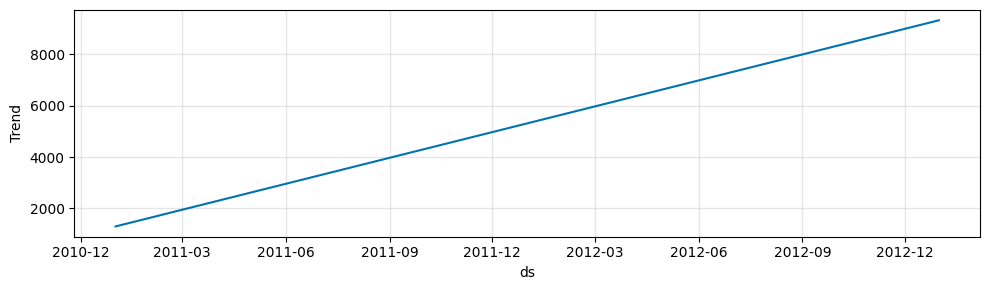

In [17]:
m.plot_parameters(components=["trend"])

ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


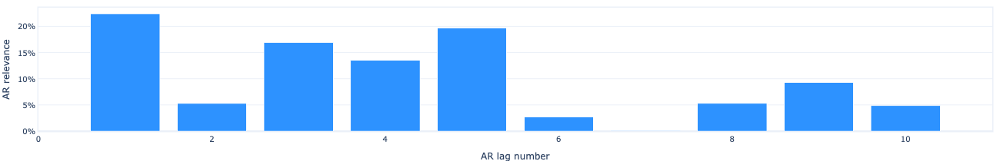

In [12]:
m.plot_parameters(components=["autoregression"])

In [13]:
metrics.tail()

,MAE,RMSE,Loss,RegLoss,epoch
125,737.750244,992.003418,0.023545,0.0,125
126,741.844116,1007.459595,0.023764,0.0,126
127,736.059021,991.991699,0.023455,0.0,127
128,737.180481,995.064697,0.023592,0.0,128
129,739.728027,993.502869,0.023858,0.0,129


## Trend + Seasonability + holidays + Auto-regressive

In [14]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

In [15]:
df = data[['ds','cnt']]
df.columns = ['ds','y']

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 130
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (23) is too small than the required number                     for the learning rate finder (222). The results might not be optimal.
Finding best initial lr: 100%|██████████| 222/222 [00:00<00:00, 454.43it/s]


Epoch 130: 100%|██████████| 130/130 [00:00<00:00, 3696.22it/s, loss=0.0186, v_num=21, MAE=628.0, RMSE=874.0, Loss=0.0181, RegLoss=0.000]   

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 89.39it/s]


INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
ERROR - (NP.plotly.plot) - plotly-resampler is not installed. Please install it to use the resampler.


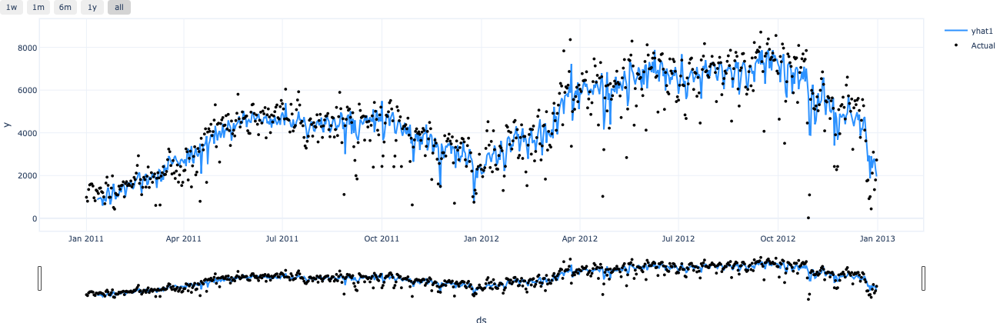

In [16]:
# Model and prediction
m = NeuralProphet(
    # Let NeuralProphet detection change points automatically
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10
)
#m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

In [17]:
forecast.tail()

,ds,y,yhat1,ar1,trend,season_yearly,season_weekly,events_additive,event_Christmas Day,event_Christmas Day (observed),...,event_Independence Day,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday
726,2012-12-27,2114,2359.891357,-1239.289429,5912.942871,-2508.065186,194.303177,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
727,2012-12-28,3095,2743.242676,-793.359253,5913.242676,-2536.136475,159.495789,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
728,2012-12-29,1341,2787.807617,-639.441345,5913.542480,-2559.736816,73.443085,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
729,2012-12-30,1796,2308.914795,-722.418335,5913.842285,-2578.707275,-303.801788,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
730,2012-12-31,2729,1959.197388,-1188.510010,5914.142578,-2592.964844,-173.470459,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
forecast.columns

Index(['ds', 'y', 'yhat1', 'ar1', 'trend', 'season_yearly', 'season_weekly',
       'events_additive', 'event_Christmas Day',
       'event_Christmas Day (observed)', 'event_Columbus Day',
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object')

ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


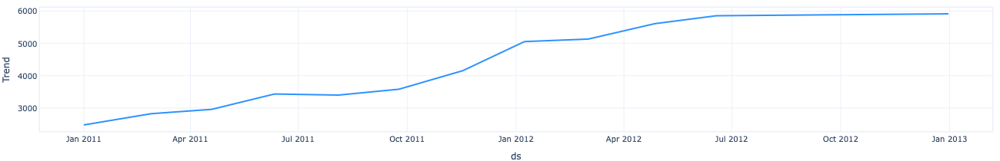

In [19]:
m.plot_parameters(components=["trend"])

ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


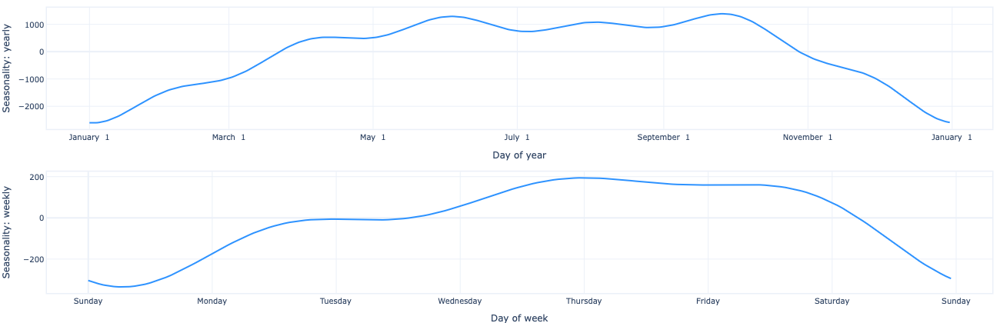

In [20]:
m.plot_parameters(components=["seasonality"])

ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


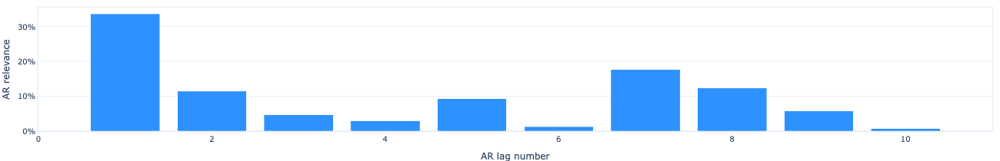

In [21]:
m.plot_parameters(components=["autoregression"])

In [22]:
df_future = m.make_future_dataframe(df, n_historic_predictions=True, periods=365)
df_future.shape

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (NP.data.splitting._make_future_dataframe) - Number of forecast steps is defined by n_forecasts. Adjusted to 1.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


(732, 2)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 174.52it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
ERROR - (NP.plotly.plot) - plotly-resampler is not installed. Please install it to use the resampler.


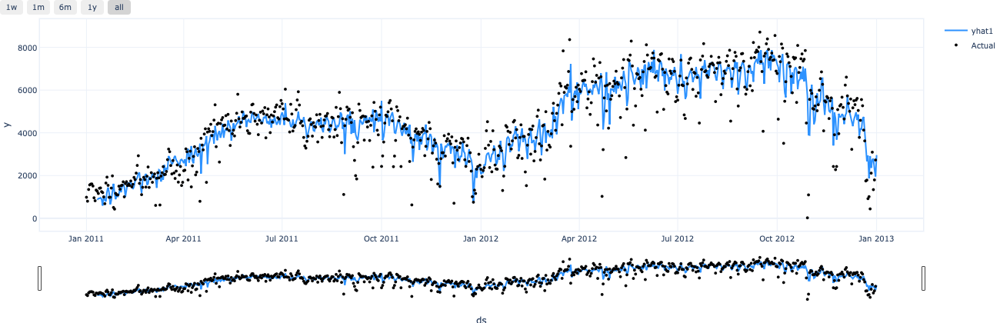

In [23]:
# Predict the future
forecast = m.predict(df_future)

# Visualize the forecast
m.plot(forecast)

In [24]:
# Predict the future
forecast = m.predict(df_future)
[df.shape, df_future.shape]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 212.95it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


[(731, 2), (732, 2)]

In [25]:
df_future.columns

Index(['ds', 'y'], dtype='object')

#### "In-time" performance metrics

In [26]:
metrics.tail()

,MAE,RMSE,Loss,RegLoss,epoch
125,629.889099,886.521973,0.018185,0.0,125
126,628.431274,874.401184,0.018186,0.0,126
127,630.930847,884.612427,0.018231,0.0,127
128,630.032898,867.166443,0.018183,0.0,128
129,627.803894,873.784790,0.018088,0.0,129


#### "Out-of-time" performance metrics

In [27]:
# Model and prediction
m = NeuralProphet(
    # Let NeuralProphet detection change points automatically
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
#m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.83% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (19) is too small than the

Epoch 1:   1%|          | 1/140 [00:00<00:00, 2410.52it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4080.06it/s, loss=10, v_num=22, MAE_val=5.91e+3, RMSE_val=7.26e+3, Loss_val=0.718, RegLoss_val=0.000, MAE=6.68e+3, RMSE=7.88e+3, Loss=0.636, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 5456.60it/s, loss=0.458, v_num=22, MAE_val=4.91e+3, RMSE_val=6.53e+3, Loss_val=0.579, RegLoss_val=0.000, MAE=5.13e+3, RMSE=6.49e+3, Loss=0.453, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 8909.83it/s, loss=0.36, v_num=22, MAE_val=3.68e+3, RMSE_val=5.06e+3, Loss_val=0.412, RegLoss_val=0.000, MAE=4.18e+3, RMSE=5.47e+3, Loss=0.349, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 14968.97it/s, loss=0.248, v_num=22, MAE_val=2.9e+3, RMSE_val=3.82e+3, Loss_val=0.295, RegLoss_val=0.000, MAE=2.88e+3, RMSE=3.84e+3, Loss=0.225, RegLoss=0.000]
V

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,885.965210,1271.522583,0.051108,0.0,135,554.633972,758.240784,0.016527,0.0
136,886.428894,1272.177856,0.051172,0.0,136,550.156433,749.081970,0.016500,0.0
137,888.352234,1275.598022,0.051411,0.0,137,548.484192,742.015808,0.016470,0.0
138,890.255676,1277.576050,0.051581,0.0,138,564.828369,769.207764,0.016678,0.0
139,892.319580,1279.609131,0.051757,0.0,139,568.100830,764.348145,0.016994,0.0


### AR Experiment 1: hidden layers [32,32]

In [28]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression and hidden layers
    n_lags=10,
    ar_layers=[32, 32]
)

m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.83% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_

Epoch 1:   1%|          | 1/140 [00:00<00:00, 2538.92it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 5559.05it/s, loss=2.62, v_num=23, MAE_val=4.79e+3, RMSE_val=5.76e+3, Loss_val=0.561, RegLoss_val=0.000, MAE=6.78e+3, RMSE=8.5e+3, Loss=0.620, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 8333.05it/s, loss=0.474, v_num=23, MAE_val=4.57e+3, RMSE_val=5.36e+3, Loss_val=0.526, RegLoss_val=0.000, MAE=4.63e+3, RMSE=5.69e+3, Loss=0.406, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 6379.17it/s, loss=0.342, v_num=23, MAE_val=3.85e+3, RMSE_val=4.54e+3, Loss_val=0.422, RegLoss_val=0.000, MAE=4.23e+3, RMSE=5.1e+3, Loss=0.359, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 6905.34it/s, loss=0.274, v_num=23, MAE_val=3.11e+3, RMSE_val=3.84e+3, Loss_val=0.322, RegLoss_val=0.000, MAE=3.37e+3, RMSE=4.39e+3, Loss=0.270, RegLoss=0.000]


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,1311.988281,1678.918091,0.086241,0.0,135,595.495056,797.034424,0.017618,0.0
136,1314.271973,1679.961060,0.086381,0.0,136,565.737122,764.524658,0.017117,0.0
137,1314.489990,1680.188721,0.086399,0.0,137,578.782410,775.453430,0.017191,0.0
138,1314.576660,1680.458374,0.086414,0.0,138,580.007141,780.980957,0.017202,0.0
139,1317.161255,1681.384644,0.086552,0.0,139,606.750854,804.758667,0.018164,0.0


WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


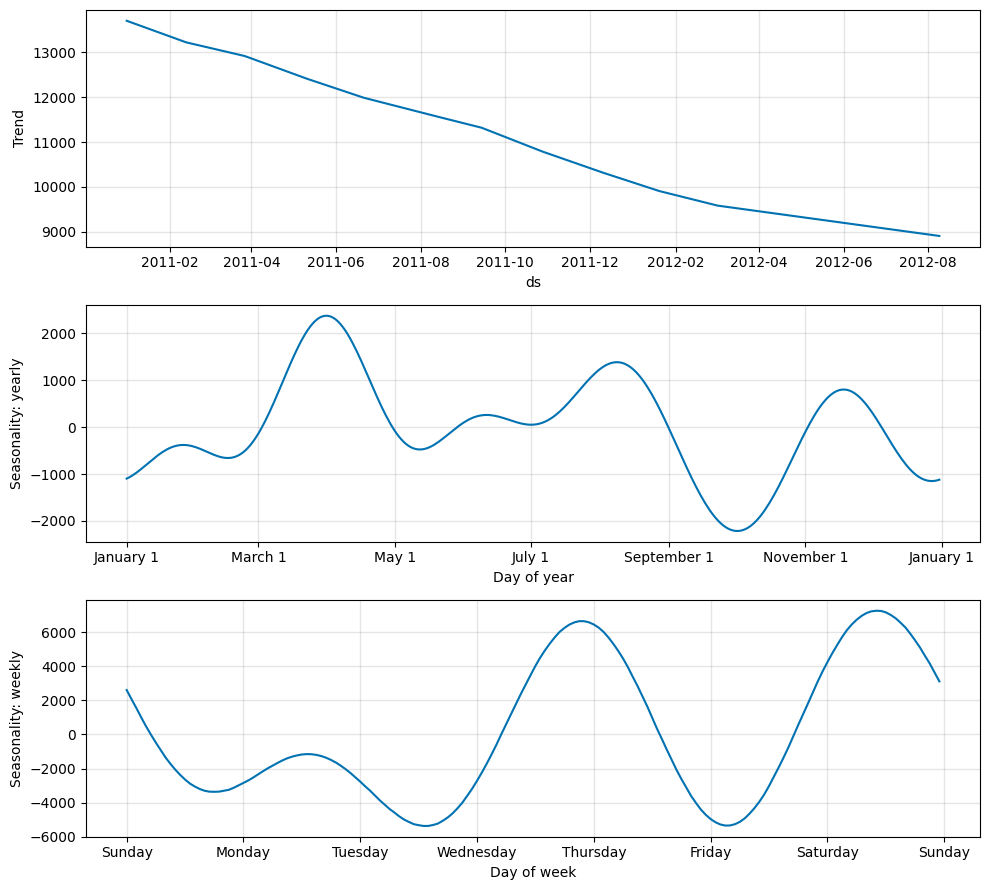

In [29]:
m.plot_parameters(components=["trend","seasonality"])

WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


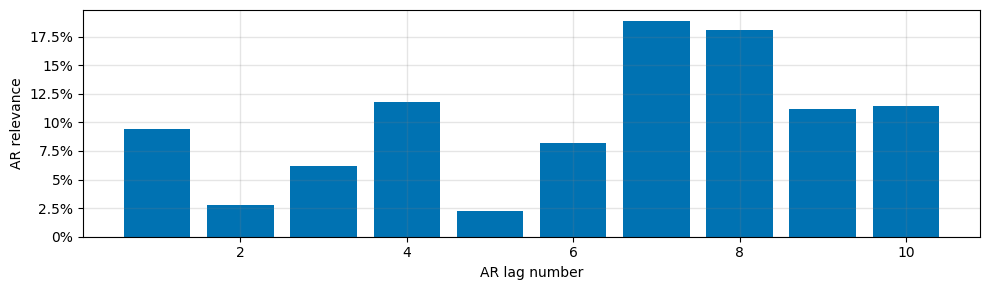

In [30]:
m.plot_parameters(components=["autoregression"])

### AR Experiment 2: hidden layers

In [31]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression and hidden layers
    n_lags=10,
    ar_layers=[8,8]
)
#m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.83% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (19) is too small than the

Epoch 1:   1%|          | 1/140 [00:00<00:00, 2666.44it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4650.00it/s, loss=2.07, v_num=24, MAE_val=3.63e+3, RMSE_val=4.49e+3, Loss_val=0.395, RegLoss_val=0.000, MAE=5.77e+3, RMSE=7.94e+3, Loss=0.534, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 5882.61it/s, loss=0.292, v_num=24, MAE_val=2.9e+3, RMSE_val=3.76e+3, Loss_val=0.298, RegLoss_val=0.000, MAE=3.69e+3, RMSE=4.79e+3, Loss=0.307, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 6442.86it/s, loss=0.253, v_num=24, MAE_val=2.64e+3, RMSE_val=3.22e+3, Loss_val=0.256, RegLoss_val=0.000, MAE=3.17e+3, RMSE=3.91e+3, Loss=0.262, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 8250.01it/s, loss=0.204, v_num=24, MAE_val=2.26e+3, RMSE_val=2.75e+3, Loss_val=0.205, RegLoss_val=0.000, MAE=2.44e+3, RMSE=3e+3, Loss=0.175, RegLoss=0.000] 
V

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,879.413818,1280.476685,0.051218,0.0,135,559.465332,761.166199,0.016465,0.0
136,879.558594,1281.345947,0.051285,0.0,136,535.712585,733.736328,0.016154,0.0
137,879.540649,1282.235840,0.051336,0.0,137,567.025879,763.801270,0.016932,0.0
138,878.579346,1282.985596,0.051359,0.0,138,559.601624,760.651794,0.016494,0.0
139,878.739014,1283.050659,0.051365,0.0,139,545.001648,743.029785,0.016228,0.0


ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


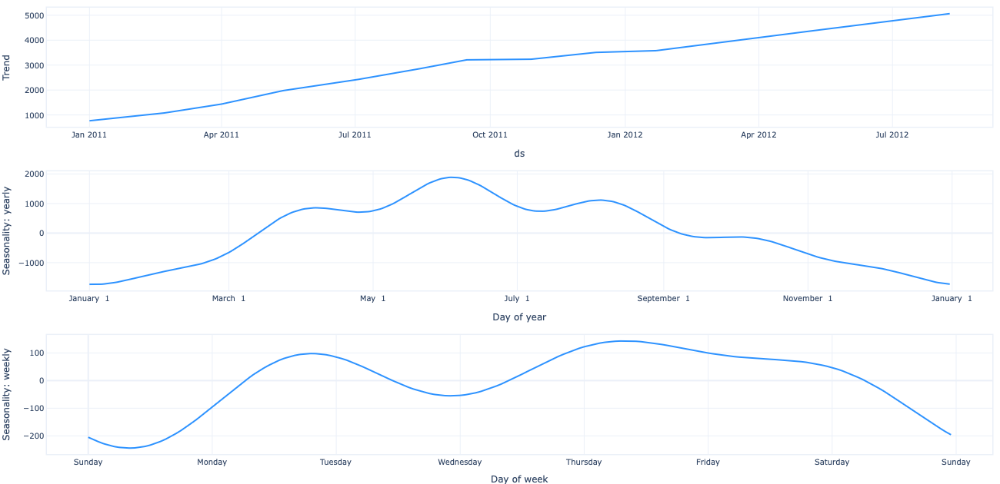

In [32]:
m.plot_parameters(components=["trend","seasonality"])

ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


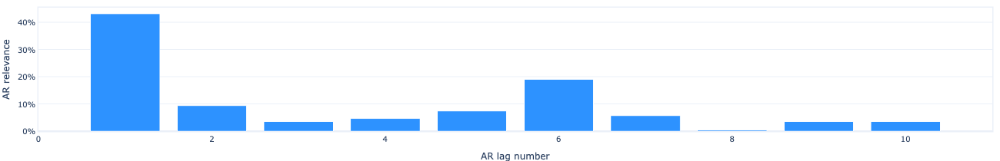

In [33]:
m.plot_parameters(components=["autoregression"])

## Trend + seasonality + holidays + AR + lagged regressors


In [34]:
df2 = data[['ds','cnt','casual']]
df2.columns = ['ds','y','casual']

<Axes: >

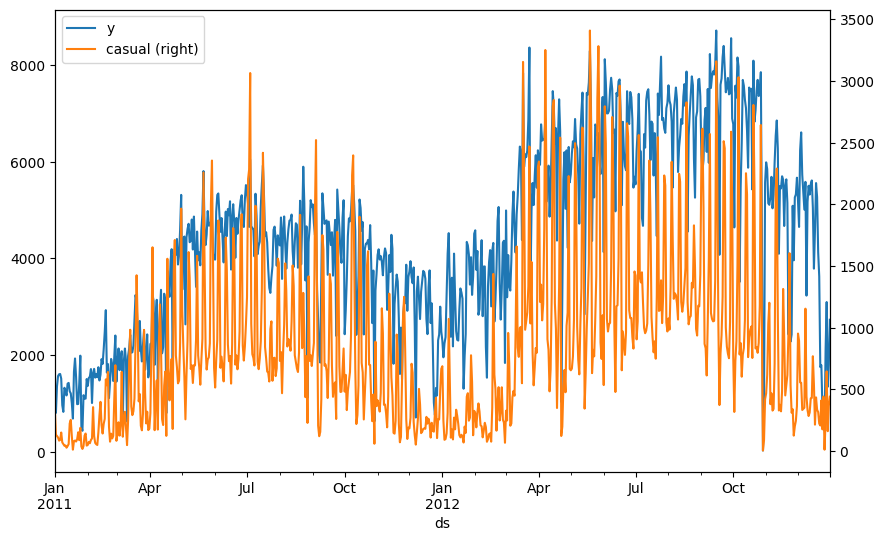

In [35]:
fig = df2.plot(x="ds", y="y", figsize=(10, 6))
df2.plot('ds', 'casual', secondary_y=True, ax=fig)

In [36]:
from neuralprophet import NeuralProphet

# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m = m.add_country_holidays("US")
#m.set_plotting_backend("matplotlib")  # Use matplotlib

# Add temperature of last three days as lagged regressor
m.add_lagged_regressor("casual", n_lags=2)

df2_train, df2_test = m.split_df(df2, valid_p=0.2)
metrics = m.fit(df2_train, validation_df=df2_test, progress="bar")
metrics.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.83% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (19) is too small than the

Epoch 1:   1%|          | 1/140 [00:00<00:00, 2730.67it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 3437.95it/s, loss=8.26, v_num=25, MAE_val=6.58e+3, RMSE_val=8.86e+3, Loss_val=0.821, RegLoss_val=0.000, MAE=7.02e+3, RMSE=8.68e+3, Loss=0.670, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 4405.78it/s, loss=0.524, v_num=25, MAE_val=5.12e+3, RMSE_val=7.16e+3, Loss_val=0.614, RegLoss_val=0.000, MAE=5.73e+3, RMSE=7.68e+3, Loss=0.537, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 2619.39it/s, loss=0.414, v_num=25, MAE_val=4.13e+3, RMSE_val=5.97e+3, Loss_val=0.476, RegLoss_val=0.000, MAE=4.45e+3, RMSE=6.07e+3, Loss=0.389, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 8156.95it/s, loss=0.383, v_num=25, MAE_val=3.27e+3, RMSE_val=4.96e+3, Loss_val=0.360, RegLoss_val=0.000, MAE=4.14e+3, RMSE=5.63e+3, Loss=0.389, RegLoss=0.000

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,860.738037,1236.926514,0.048725,0.0,135,571.098022,768.370117,0.016805,0.0
136,858.325745,1239.395386,0.048829,0.0,136,554.217346,748.113647,0.016390,0.0
137,857.640991,1238.713501,0.048760,0.0,137,558.817566,754.589600,0.016416,0.0
138,858.981201,1240.764038,0.048920,0.0,138,576.932251,769.030334,0.017204,0.0
139,860.877502,1242.861328,0.049094,0.0,139,645.624390,844.414062,0.024159,0.0


ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


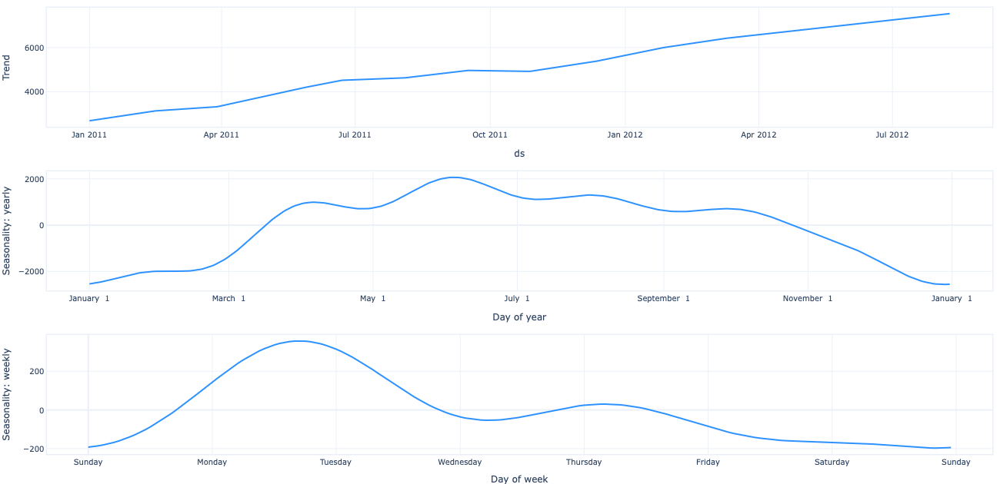

In [37]:
m.plot_parameters(components=["trend","seasonality"])

ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


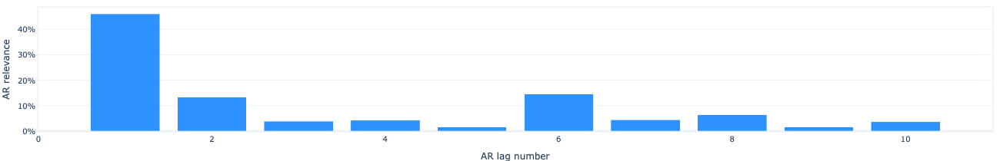

In [38]:
m.plot_parameters(components=["autoregression"])

## Trend + seasonality + holidays + AR + lagged regressors + future regressors

In [39]:
df2 = data[['ds','cnt','temp','casual']]
df2.columns = ['ds','y','temperature','casual']

<Axes: >

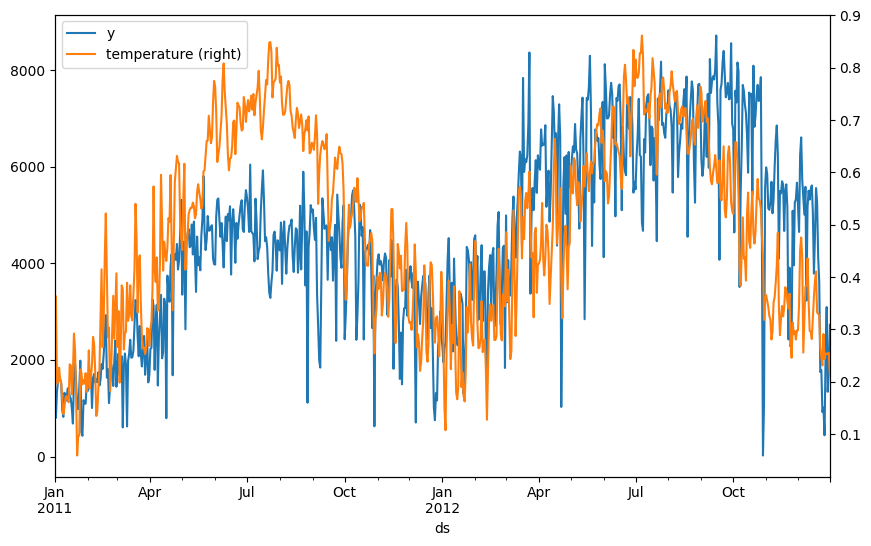

In [40]:
fig = df2.plot(x="ds", y="y", figsize=(10, 6))
df2.plot('ds', 'temperature', secondary_y=True, ax=fig)

In [41]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m = m.add_country_holidays("US")
#m.set_plotting_backend("matplotlib")  # Use matplotlib

m.add_lagged_regressor("casual", n_lags=2)

# Add the new future regressor
m.add_future_regressor("temperature")

df2_train, df2_test = m.split_df(df2, valid_p=0.2)
metrics = m.fit(df2_train, validation_df=df2_test, progress="bar")
metrics.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.83% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (19) is too small than the

Epoch 1:   1%|          | 1/140 [00:00<00:00, 2062.10it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4899.89it/s, loss=4.18, v_num=26, MAE_val=1.34e+4, RMSE_val=1.67e+4, Loss_val=1.810, RegLoss_val=0.000, MAE=1.42e+4, RMSE=1.74e+4, Loss=1.480, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 6111.18it/s, loss=1.26, v_num=26, MAE_val=1.16e+4, RMSE_val=1.42e+4, Loss_val=1.550, RegLoss_val=0.000, MAE=1.29e+4, RMSE=1.55e+4, Loss=1.320, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 10901.37it/s, loss=1.12, v_num=26, MAE_val=9.93e+3, RMSE_val=1.19e+4, Loss_val=1.300, RegLoss_val=0.000, MAE=1.09e+4, RMSE=1.3e+4, Loss=1.080, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 6062.89it/s, loss=0.879, v_num=26, MAE_val=8.63e+3, RMSE_val=1.02e+4, Loss_val=1.110, RegLoss_val=0.000, MAE=8.67e+3, RMSE=1.04e+4, Loss=0.865, RegLoss=0.000]


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,838.080750,1189.862183,0.045419,0.0,135,565.268188,747.616028,0.016228,0.0
136,837.815552,1190.352905,0.045440,0.0,136,567.688293,751.070312,0.016239,0.0
137,837.873474,1190.880981,0.045470,0.0,137,563.149231,740.474792,0.016196,0.0
138,837.702026,1191.322998,0.045490,0.0,138,599.814941,781.742676,0.017065,0.0
139,838.092224,1192.055176,0.045535,0.0,139,576.177124,760.659363,0.016507,0.0


ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


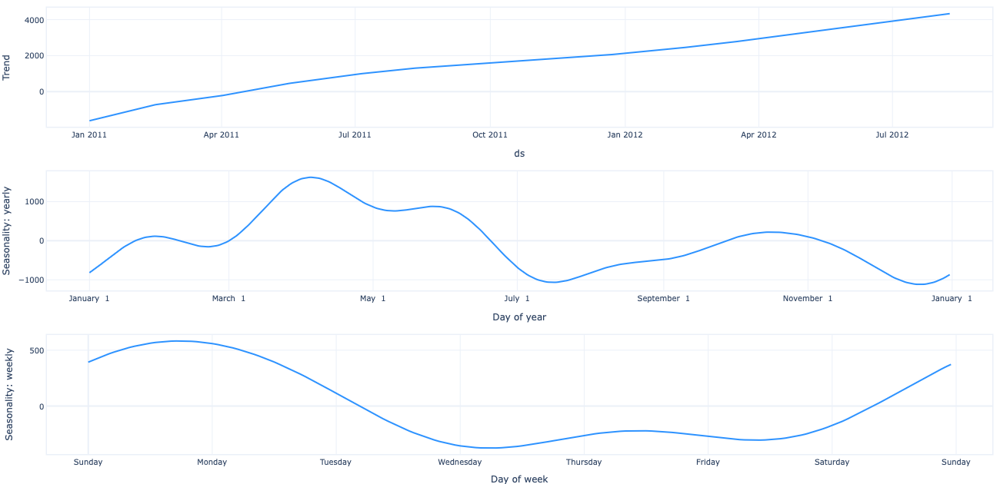

In [42]:
m.plot_parameters(components=["trend","seasonality"])

# Forecast
## Trend + seasonality + holidays + AR

In [43]:
from neuralprophet import NeuralProphet

# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
    # Forecast the next 50 days
    n_forecasts= 50
)
m = m.add_country_holidays("US")
#m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.821% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (16) is too small than th

Epoch 1:   1%|          | 1/140 [00:00<00:00, 2299.51it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4288.65it/s, loss=4.8, v_num=27, MAE_val=2.6e+4, RMSE_val=3.14e+4, Loss_val=3.810, RegLoss_val=0.000, MAE=2.11e+4, RMSE=2.64e+4, Loss=2.340, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 5711.72it/s, loss=2.01, v_num=27, MAE_val=2.15e+4, RMSE_val=2.67e+4, Loss_val=3.120, RegLoss_val=0.000, MAE=1.78e+4, RMSE=2.28e+4, Loss=1.960, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 5305.89it/s, loss=1.67, v_num=27, MAE_val=1.75e+4, RMSE_val=2.23e+4, Loss_val=2.510, RegLoss_val=0.000, MAE=1.49e+4, RMSE=1.94e+4, Loss=1.620, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 9804.36it/s, loss=1.35, v_num=27, MAE_val=1.39e+4, RMSE_val=1.84e+4, Loss_val=1.980, RegLoss_val=0.000, MAE=1.24e+4, RMSE=1.64e+4, Loss=1.330, RegLoss=0.000]
Val

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,1025.607544,1406.212280,0.063626,0.0,135,702.839966,940.207336,0.025941,0.0
136,1025.413818,1406.448608,0.063637,0.0,136,701.521057,938.689758,0.025905,0.0
137,1024.949463,1406.200195,0.063596,0.0,137,703.208984,940.943726,0.026021,0.0
138,1024.700195,1406.936157,0.063627,0.0,138,703.868652,942.653076,0.026110,0.0
139,1025.174194,1406.969360,0.063647,0.0,139,701.678040,939.430786,0.025921,0.0


In [44]:
print(df_train.shape)
print(np.max(df_train['ds']))

(558, 2)
2012-07-11 00:00:00


In [45]:
def make_future_data(df,periods):
  timeindex = pd.date_range(start=np.max(df['ds']),periods=periods)
  df2 = pd.DataFrame({'ds':timeindex})
  df_future = df.merge(df2,left_on='ds',right_on='ds', how='outer')
  return(df_future)

df_train_future = make_future_data(df_train,periods=50)
df_train_future.shape

(607, 2)

In [46]:
df_train_future.tail()

,ds,y
602,2012-08-25,NaN
603,2012-08-26,NaN
604,2012-08-27,NaN
605,2012-08-28,NaN
606,2012-08-29,NaN


In [48]:
df_train_forecast = m.predict(df_train_future)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.835% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.835% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 49 rows at the end with NaNs in 'y' column.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 89.98it/s] 

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [49]:
print(df_train_forecast.shape)
print(df_train_forecast.columns)

(607, 119)
Index(['ds', 'y', 'yhat1', 'yhat2', 'yhat3', 'yhat4', 'yhat5', 'yhat6',
       'yhat7', 'yhat8',
       ...
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object', length=119)


In [50]:
df_train_forecast.columns[100:150]

Index(['ar49', 'ar50', 'trend', 'season_yearly', 'season_weekly',
       'events_additive', 'event_Christmas Day',
       'event_Christmas Day (observed)', 'event_Columbus Day',
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object')

In [51]:
dd = df_train_forecast.merge(df_test[['ds','y']],left_on='ds',right_on='ds', how='outer')
dd.shape

(731, 120)

In [52]:
dd

,ds,y_x,yhat1,yhat2,yhat3,yhat4,yhat5,yhat6,yhat7,yhat8,...,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday,y_y
0,2011-01-01,985.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-01-02,801.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-01-03,1349.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-01-04,1562.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-01-05,1600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,2012-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2114.0
727,2012-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3095.0
728,2012-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1341.0
729,2012-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1796.0


# Quantile

In [196]:
from neuralprophet import NeuralProphet
quantile_list=[0.05,0.1,0.5,0.9,0.95 ]
# Model and prediction
m = NeuralProphet(
    quantiles=quantile_list,
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    #n_lags=10,
    # Forecast the next 50 days
    #n_forecasts= 50
)
m = m.add_country_holidays("US")
m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.829% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch

Epoch 1:   1%|          | 1/130 [00:00<00:00, 3021.83it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 4683.76it/s, loss=3.36, v_num=66, MAE_val=8.4e+3, RMSE_val=9.15e+3, Loss_val=5.680, RegLoss_val=0.000, MAE=6.34e+3, RMSE=7.07e+3, Loss=3.100, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 5521.24it/s, loss=2.49, v_num=66, MAE_val=7.4e+3, RMSE_val=8.09e+3, Loss_val=4.910, RegLoss_val=0.000, MAE=5.21e+3, RMSE=5.86e+3, Loss=2.460, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 6548.48it/s, loss=1.86, v_num=66, MAE_val=6.35e+3, RMSE_val=7.03e+3, Loss_val=4.110, RegLoss_val=0.000, MAE=4.15e+3, RMSE=4.8e+3, Loss=1.860, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 12235.43it/s, loss=1.29, v_num=66, MAE_val=5.23e+3, RMSE_val=5.88e+3, Loss_val=3.280, RegLoss_val=0.000, MAE=3.03e+3, RMSE=3.73e+3, Loss=1.280, RegLoss=0.000]
Val

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1153.224976,1595.096313,0.168490,0.0,125,596.194702,797.921326,0.034778,0.0
126,1151.967773,1594.686890,0.168461,0.0,126,594.584534,806.848328,0.034763,0.0
127,1151.869873,1594.666016,0.168603,0.0,127,612.927979,826.560181,0.036500,0.0
128,1153.593262,1597.017212,0.169120,0.0,128,595.278870,807.089417,0.034900,0.0
129,1155.163086,1598.080322,0.169462,0.0,129,612.955505,826.805298,0.037082,0.0


In [197]:
future = m.make_future_dataframe(df, periods=50, n_historic_predictions=100) #, n_historic_predictions=1)

# Perform prediction with the trained models
forecast = m.predict(df=future)
forecast.tail(60)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 50 rows at the end with NaNs in 'y' column.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 504.55it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


,ds,y,yhat1,yhat1 5.0%,yhat1 10.0%,yhat1 90.0%,yhat1 95.0%,trend,season_yearly,season_weekly,...,event_Independence Day,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday
90,2012-12-22,1749,5483.405273,3646.278564,5015.480957,6052.526855,7176.073730,6811.022949,-1373.807373,46.189587,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
91,2012-12-23,1787,5281.318359,3902.799805,5234.384277,5579.278809,6646.957031,6816.839355,-1375.812622,-159.708191,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
92,2012-12-24,920,5361.093750,4126.952148,5321.852539,5538.009277,6564.424805,6822.656250,-1376.246948,-85.315506,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
93,2012-12-25,1013,3583.591553,3534.675781,3583.591553,3583.591553,4381.767090,6828.472656,-1375.111450,50.442669,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
94,2012-12-26,441,5367.773438,4064.963867,5290.225586,5721.051270,6827.738770,6834.289062,-1372.439575,-94.076309,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
95,2012-12-27,2114,5610.885254,4468.339355,5610.885254,5803.845703,6882.658203,6840.105957,-1368.270874,139.050186,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
96,2012-12-28,3095,5586.964355,4358.857422,5586.964355,5934.832520,7111.061035,6845.922363,-1362.663208,103.705215,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
97,2012-12-29,1341,5542.394043,3742.167725,5118.314453,6090.973633,7328.861328,6851.739258,-1355.673462,46.328369,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
98,2012-12-30,1796,5350.326172,4010.662598,5347.891113,5625.990723,6807.963379,6857.555664,-1347.381348,-159.847870,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
99,2012-12-31,2729,5440.063477,4246.895508,5440.063477,5592.684082,6733.111328,6863.372070,-1337.867920,-85.440605,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000


In [198]:
#!pip install plotly-resampler

WARNING - (NP.forecaster.plot) - highlight_forecast_step_n is ignored since auto-regression not enabled.


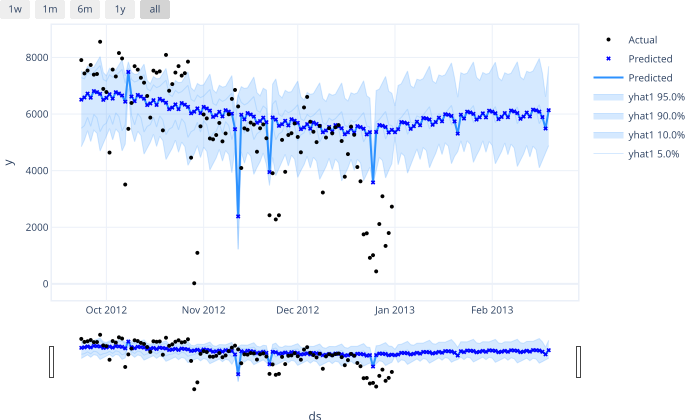

In [199]:
m.highlight_nth_step_ahead_of_each_forecast(1).plot(
    forecast, 
    plotting_backend="plotly-static"
    #plotting_backend = "matplotlib"
)

# Conformal quantile regression (CQR)

## (1) The naive method:
It involves:
- predict the output value of the instances within the calibration set
- calculate absolute residual by comparing the actual and predicted value for each observation in the calibration set
- sort all absolute residual in ascending order
- finds the quantified uncertainty
- use the quantified uncertainty to make the final prediciton intervals.

In [200]:
cp_model = NeuralProphet(
    quantiles=quantile_list,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    #n_lags=10,
    learning_rate=0.003    
)
cp_model.set_plotting_backend("plotly-static")

In [201]:
df_train, df_test = m.split_df(df, valid_p=0.2)
df_train, df_cal = m.split_df(df_train, freq="D", valid_p=1.0 / 11)
[df_train.shape, df_test.shape, df_cal.shape]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.829% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


[(532, 2), (146, 2), (53, 2)]

In [202]:
set_random_seed(0)
metrics1 = cp_model.fit(df_train, freq="D")

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.812% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140


Epoch 140: 100%|██████████| 140/140 [00:00<00:00, 4543.58it/s, loss=0.049, v_num=67, MAE=729.0, RMSE=932.0, Loss=0.0494, RegLoss=0.000]     


In [204]:
future = cp_model.make_future_dataframe(df, periods=50, n_historic_predictions=True) #, n_historic_predictions=1)

# Parameter for naive conformal prediction
method = "naive"
alpha = 0.05

# Enable conformal prediction on the pre-trained models
naive_forecast = cp_model.conformal_predict(
    #df_test,
    future,
    calibration_df=df_cal,
    alpha=alpha,
    method=method,
    show_all_PI=True,
)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.113% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.113% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 701.86it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.872% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.872% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 50 rows at the end with NaNs in 'y' column.



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 243.67it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [205]:
naive_forecast

,ds,y,yhat1,yhat1 - qhat1,yhat1 10.0%,yhat1 90.0%,yhat1 + qhat1,trend,season_yearly,season_weekly,yhat1 5.0%,yhat1 10.0%,yhat1 90.0%,yhat1 95.0%
0,2011-01-01,985,-540.242737,-2616.717285,-1028.983643,643.268555,1536.231934,992.749390,-1638.660400,105.668259,-1232.512207,-1028.983643,643.268555,1618.996704
1,2011-01-02,801,-715.748047,-2792.222656,-844.605347,323.515564,1360.726562,1006.139404,-1601.943481,-119.943993,-1109.437744,-844.605347,323.515564,1098.164795
2,2011-01-03,1349,-682.607178,-2759.081787,-727.524170,402.218140,1393.867432,1019.529358,-1564.478638,-137.657944,-732.348145,-727.524170,402.218140,1154.893433
3,2011-01-04,1562,-475.248962,-2551.723633,-475.248962,526.129456,1601.225586,1032.919312,-1526.452637,18.284340,-475.248962,-475.248962,526.129456,1298.352783
4,2011-01-05,1600,-578.013123,-2654.487793,-657.738281,499.205139,1498.461426,1046.309326,-1488.182251,-136.140121,-679.531616,-657.738281,499.205139,1206.558472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776,2013-02-15,None,5784.591797,3708.117188,2615.747314,7407.662109,7861.066406,6516.859863,-877.295654,145.027740,2615.747314,2615.747314,7407.662109,7407.662109
777,2013-02-16,None,5759.474609,3683.000000,2147.879883,7541.970215,7835.949219,6521.350098,-867.800415,105.925285,2114.765625,2147.879883,7541.970215,7541.970215
778,2013-02-17,None,5549.347168,3472.872559,2292.694824,7173.571777,7625.821777,6525.839844,-856.249634,-120.243484,2192.496338,2292.694824,7173.571777,7173.571777
779,2013-02-18,None,5550.089355,3473.614746,2371.700928,7208.279297,7626.563965,6530.329590,-842.694580,-137.545959,2371.700928,2371.700928,7208.279297,7208.279297


In [206]:
naive_qhat = naive_forecast.iloc[-1]["yhat1"] - naive_forecast.iloc[-1]["yhat1 - qhat1"]  # cp_model
naive_qhat

2076.4746

In [207]:
#!pip install -U kaleido

WARNING - (NP.forecaster.plot) - highlight_forecast_step_n is ignored since auto-regression not enabled.


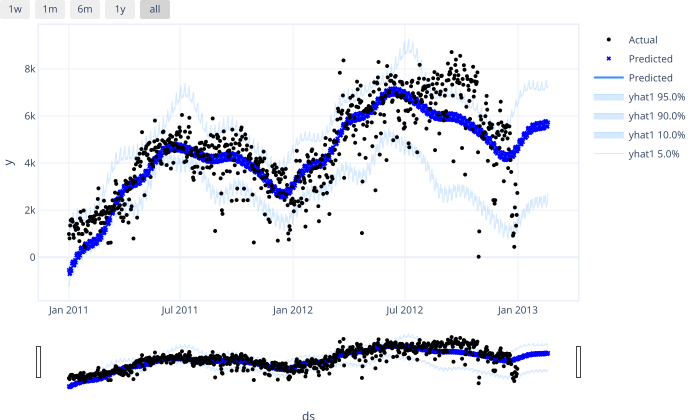

In [208]:
fig = cp_model.highlight_nth_step_ahead_of_each_forecast(1).plot(naive_forecast,
    plotting_backend="plotly-static"
    #plotting_backend = "matplotlib"
)
fig

## (2) CQR
Conformalized Quantile Regression runs as follows:
- calculate non-conformity scores as the differences between data points from the calibration dataset and their nearest prediction quantile, which provides a measure of how well the data fits the current quantile regression model. The non-conformity scores are negative for data points within the quantile regression interval and positive if they are outside the interval;
- sort list of non-conformity scores;
- find the value of such that the portion of scores in the list greater than is equal to that error rate; and
- adjust the quantiles from the regression model. 

In [226]:
from neuralprophet import NeuralProphet
quantile_list=[0.05,0.1,0.5,0.9,0.95 ]
# Model and prediction
cqr_model = NeuralProphet(
    quantiles=quantile_list,
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    #n_lags=10,
    # Forecast the next 50 days
    #n_forecasts= 50
)
cqr_model = cqr_model.add_country_holidays("US")
#cqr_model.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = cqr_model.split_df(df, valid_p=0.2)
metrics = cqr_model.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.829% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 130
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (19) is too small than th

Epoch 1:   1%|          | 1/130 [00:00<00:00, 1984.06it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 4877.10it/s, loss=2.08, v_num=69, MAE_val=7.09e+3, RMSE_val=8.01e+3, Loss_val=3.400, RegLoss_val=0.000, MAE=5.63e+3, RMSE=6.6e+3, Loss=1.640, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 7752.87it/s, loss=1.31, v_num=69, MAE_val=6.44e+3, RMSE_val=7.37e+3, Loss_val=2.940, RegLoss_val=0.000, MAE=4.87e+3, RMSE=5.77e+3, Loss=1.300, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 10498.88it/s, loss=0.986, v_num=69, MAE_val=5.78e+3, RMSE_val=6.74e+3, Loss_val=2.500, RegLoss_val=0.000, MAE=4.17e+3, RMSE=5.02e+3, Loss=0.997, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 9291.77it/s, loss=0.73, v_num=69, MAE_val=5.08e+3, RMSE_val=6.08e+3, Loss_val=2.070, RegLoss_val=0.000, MAE=3.54e+3, RMSE=4.34e+3, Loss=0.741, RegLoss=0.000]


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1175.912598,1507.957642,0.162181,0.0,125,611.006470,817.383301,0.035546,0.0
126,1176.464966,1507.063232,0.162165,0.0,126,607.947327,808.479126,0.035199,0.0
127,1173.984741,1505.796265,0.161639,0.0,127,624.900696,837.469971,0.037710,0.0
128,1171.399414,1505.587891,0.161140,0.0,128,621.990417,849.685669,0.040036,0.0
129,1171.447388,1505.065674,0.161018,0.0,129,607.575989,817.226746,0.035557,0.0


In [227]:
future = cqr_model.make_future_dataframe(df, periods=50, n_historic_predictions=True) #, n_historic_predictions=1)

# Parameter for Conformalized Quantile Regression
method = "cqr"

# Enable conformal predict on the pre-trained models
# Evaluate parameter is optional, refer to the "Evaluate Performance" session below
cqr_forecast = cqr_model.conformal_predict(
    #df_test,
    future,
    calibration_df=df_cal, alpha=alpha, method=method
)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.113% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.113% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 407.85it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.872% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.872% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


INFO - (NP.data.processing._handle_missing_data) - Dropped 50 rows at the end with NaNs in 'y' column.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 325.92it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [228]:
cqr_forecast

,ds,y,yhat1,yhat1 5.0%,yhat1 10.0%,yhat1 90.0%,yhat1 95.0%,trend,season_yearly,season_weekly,...,event_Independence Day,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday
0,2011-01-01,985,682.074585,-302.437073,682.074585,1345.253906,2461.119873,2460.674805,-1569.292236,31.373095,...,0.0,0.0,0.0,0.0,-240.681091,0.0,0.0,0.0,0.0,0.000000
1,2011-01-02,801,734.452148,-689.342896,734.452148,1778.839111,3005.806641,2465.874512,-1560.725098,-170.697357,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
2,2011-01-03,1349,838.984741,-402.516113,838.984741,1745.050049,2900.342773,2471.074707,-1550.987793,-81.102043,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
3,2011-01-04,1562,989.815796,-44.811035,989.815796,1999.725342,3213.000488,2476.274414,-1540.219482,53.760853,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
4,2011-01-05,1600,850.913147,-444.865936,832.654663,1943.333374,3161.774414,2481.474365,-1528.527588,-102.033615,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776,2013-02-15,None,5239.895020,2150.834229,2864.416748,5239.895020,5953.477539,6377.038574,-1252.868896,115.725655,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
777,2013-02-16,None,5168.951172,1624.882080,2338.464600,5168.951172,6034.652344,6380.482910,-1243.176636,31.645010,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
778,2013-02-17,None,4981.486816,1834.818359,2548.400879,4981.486816,5695.069336,6383.927246,-1231.459839,-170.980713,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
779,2013-02-18,None,4585.838867,2057.433838,2771.016357,4585.838867,5299.421387,6387.372070,-1217.810669,-80.937691,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,-502.785248


WARNING - (NP.forecaster.plot) - highlight_forecast_step_n is ignored since auto-regression not enabled.


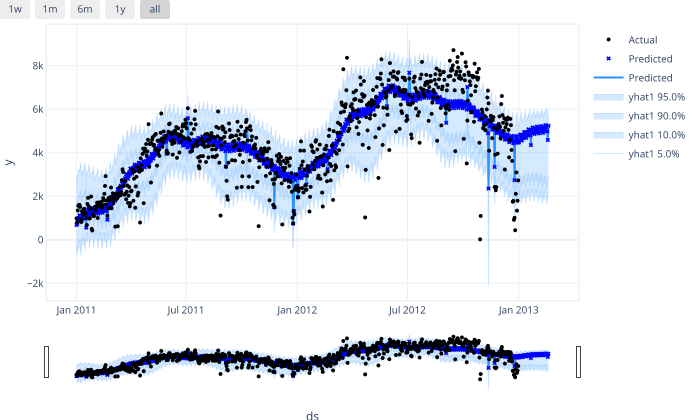

In [229]:
fig = cqr_model.highlight_nth_step_ahead_of_each_forecast(1).plot(cqr_forecast, 
    #plotting_backend = "matplotlib"
    plotting_backend="plotly-static"
)

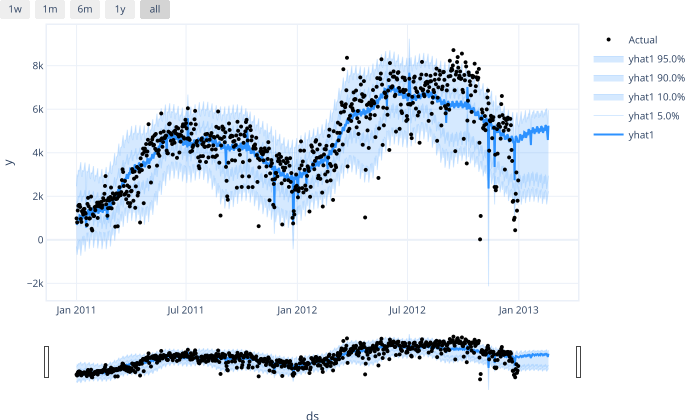

In [230]:
fig = cqr_model.plot(cqr_forecast, 
    #plotting_backend = "matplotlib"
    plotting_backend="plotly-static"
)

In [231]:
df

,ds,y
0,2011-01-01,985
1,2011-01-02,801
2,2011-01-03,1349
3,2011-01-04,1562
4,2011-01-05,1600
...,...,...
726,2012-12-27,2114
727,2012-12-28,3095
728,2012-12-29,1341
729,2012-12-30,1796
